# Forecast model selection for PM2.5 levels in China
- <b>The purpose of this notebook is to create an appropriate model to forecast PM2.5 levels in China<b>
- <b> It is a time series forecasting project 

## Methodology

- <b>Load the necessary libraries<b>
- <b> Load data in pandas Data frame from the available csv format<b>
    
- <b>Exploratory data Analysis  <b>
- <b>Data visualizations for feature selection<b>
- <b>Data cleaning and resampling<b>
- <b>Model Selection <b>
- <b>Multi variate time series model using Deep learning LSTM sequence model<b>
    - <b>Dependent feature selection<b>
    - <b>Data scaling and Data selection for train/test<b>
    - <b>Model Architecture<b>
    - <b>Model Training<b>
    - <b>Model metrics with plots and interpretation<b>
- <b>Conclusions 
    
<br>
    Notes: There is detailed "@Comments" section before the methods/codes are being executed

## <b>Load the necessary libraries<b>

In [1]:
# for loading data 
import pandas as pd
import numpy as np

# for plotting
import seaborn as sns
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = [16,9]
import plotly.express as px

# supress the warning messages
import itertools
import warnings

# model processing 
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import tensorflow as tf


mpl.rcParams['figure.figsize'] = (10, 8)
mpl.rcParams['axes.grid'] = False

## Load data in pandas Dataframe from the available csv format

In [2]:
df1=pd.read_csv("BeijingPM20100101_20151231.csv")
df2=pd.read_csv("ChengduPM20100101_20151231.csv")
df3=pd.read_csv("GuangzhouPM20100101_20151231.csv")
df4=pd.read_csv("ShanghaiPM20100101_20151231.csv")
df5=pd.read_csv("ShenyangPM20100101_20151231.csv")

In [3]:
df1.head()

,No,year,month,day,hour,season,PM_Dongsi,PM_Dongsihuan,PM_Nongzhanguan,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,NaN,-21.0,43.0,1021.0,-11.0,NW,1.79,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,NaN,-21.0,47.0,1020.0,-12.0,NW,4.92,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,NaN,-21.0,43.0,1019.0,-11.0,NW,6.71,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,NaN,-21.0,55.0,1019.0,-14.0,NW,9.84,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,NaN,-20.0,51.0,1018.0,-12.0,NW,12.97,0.0,0.0


In [4]:
df2.head()

,No,year,month,day,hour,season,PM_Caotangsi,PM_Shahepu,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,4.0,81.20,1022.0,7.0,cv,1.0,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,4.0,86.99,1022.0,6.0,cv,1.0,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,4.0,86.99,1021.0,6.0,cv,1.0,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,3.0,86.89,1021.0,5.0,cv,1.0,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,2.0,86.79,1021.0,4.0,cv,1.0,0.0,0.0


In [5]:
df3.head()

,No,year,month,day,hour,season,PM_City Station,PM_5th Middle School,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4.0,NaN,NaN,NaN,9.4,76.0,1015.1,13.5,NW,0.8,0.0,0.0
1,2,2010,1,1,1,4.0,NaN,NaN,NaN,10.2,83.0,1015.2,13.0,cv,0.5,0.0,0.0
2,3,2010,1,1,2,4.0,NaN,NaN,NaN,10.4,87.0,1015.0,12.5,NW,0.6,0.3,0.3
3,4,2010,1,1,3,4.0,NaN,NaN,NaN,10.2,89.0,1014.9,12.0,NW,1.4,0.6,0.9
4,5,2010,1,1,4,4.0,NaN,NaN,NaN,10.4,91.0,1014.6,11.8,NE,0.6,0.7,1.6


In [6]:
df4.head()

,No,year,month,day,hour,season,PM_Jingan,PM_US Post,PM_Xuhui,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,-6.0,59.48,1026.1,1.0,cv,1.0,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,-6.0,59.48,1025.1,1.0,SE,2.0,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,-7.0,59.21,1025.1,0.0,SE,4.0,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,-6.0,63.94,1024.0,0.0,SE,5.0,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,-6.0,63.94,1023.0,0.0,SE,8.0,0.0,0.0


In [7]:
df5.head()

,No,year,month,day,hour,season,PM_Taiyuanjie,PM_US Post,PM_Xiaoheyan,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,-26.0,69.79,1024.0,-22.0,NE,1.0289,NaN,NaN
1,2,2010,1,1,1,4,NaN,NaN,NaN,-26.0,76.26,1024.0,-23.0,NE,2.5722,NaN,NaN
2,3,2010,1,1,2,4,NaN,NaN,NaN,-27.0,69.56,1023.0,-23.0,NE,5.1444,NaN,NaN
3,4,2010,1,1,3,4,NaN,NaN,NaN,-27.0,69.56,1023.0,-23.0,NE,7.7166,NaN,NaN
4,5,2010,1,1,4,4,NaN,NaN,NaN,-27.0,69.56,1022.0,-23.0,NE,9.7744,NaN,NaN


## Exploratory data Analysis
- The analysis shows that the PM2.5 values are available per hour from 2010 to 2015 in numeric format
- There are 8 other features available together with PM values and the date
- Although the date (year, month, day and hour) has no null values but the other features do have null values

#### @Comments
- First csv file "BeijingPM20100101_20151231.csv" is selected for in depth analysis
- To get one value of PM2.5 in Beijing, the mean of available 4 regions is calculated'PM_Dongsi','PM_Dongsihuan','PM_Nongzhanguan','PM_US Post'
 

In [8]:
df1.isnull().sum()

No                     0
year                   0
month                  0
day                    0
hour                   0
season                 0
PM_Dongsi          27532
PM_Dongsihuan      32076
PM_Nongzhanguan    27653
PM_US Post          2197
DEWP                   5
HUMI                 339
PRES                 339
TEMP                   5
cbwd                   5
Iws                    5
precipitation        484
Iprec                484
dtype: int64

In [9]:
df1.dtypes

No                   int64
year                 int64
month                int64
day                  int64
hour                 int64
season               int64
PM_Dongsi          float64
PM_Dongsihuan      float64
PM_Nongzhanguan    float64
PM_US Post         float64
DEWP               float64
HUMI               float64
PRES               float64
TEMP               float64
cbwd                object
Iws                float64
precipitation      float64
Iprec              float64
dtype: object

In [10]:
df1.shape

(52584, 18)

In [11]:
df1.year.unique()

array([2010, 2011, 2012, 2013, 2014, 2015], dtype=int64)

In [12]:
df1.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [13]:
df1.day.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31],
      dtype=int64)

In [14]:
df1.season.unique()

array([4, 1, 2, 3], dtype=int64)

In [15]:
df1['PM25'] = df1[['PM_Dongsi','PM_Dongsihuan','PM_Nongzhanguan','PM_US Post']].mean(skipna=True,axis=1)

In [16]:
df1.head()

,No,year,month,day,hour,season,PM_Dongsi,PM_Dongsihuan,PM_Nongzhanguan,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec,PM25
0,1,2010,1,1,0,4,NaN,NaN,NaN,NaN,-21.0,43.0,1021.0,-11.0,NW,1.79,0.0,0.0,NaN
1,2,2010,1,1,1,4,NaN,NaN,NaN,NaN,-21.0,47.0,1020.0,-12.0,NW,4.92,0.0,0.0,NaN
2,3,2010,1,1,2,4,NaN,NaN,NaN,NaN,-21.0,43.0,1019.0,-11.0,NW,6.71,0.0,0.0,NaN
3,4,2010,1,1,3,4,NaN,NaN,NaN,NaN,-21.0,55.0,1019.0,-14.0,NW,9.84,0.0,0.0,NaN
4,5,2010,1,1,4,4,NaN,NaN,NaN,NaN,-20.0,51.0,1018.0,-12.0,NW,12.97,0.0,0.0,NaN


## Data visualizations for feature selection 
<b>Plot the various features (PM2.5, year, month, temperature, etc) to find any relationships.


- The yearly plot with PM concentration shows a consistent increase from 2010 to 2015 which might be because of increase in population. There is a significant rise in the year 2013 
- The <b>monthly</b> plot clearly shows that winter months have a much larger variation in PM2.5 concentration, including some very high values.
- The days plot do not have a significant pattern but a slight increase in PM concentration during the end of the month is visible.
- The hours plot too do not have a significant pattern, but a slight increase in the morning and the evening hours are visible. 
- The <b>season</b> plot has a significant pattern with a slight high in season 1 and increasing gradually till season 4.
- The <b>Dew point</b> has significant correlation with the PM value. Having a maximum at around -10 to 0 $^0$C and decreasing steeply from -10 to -40 $^0$C. 
- The <b>temperature</b> plot has a pattern which effects the PM value.
- The <b>Humidity</b> plot has a pattern which effects the PM value.
- The <b>Pressure</b> plot has a pattern which effects the PM value.
- The <b>Cumulated wind speed</b> plot has a pattern which effects the PM value.
- There is no correlation of the PM value with the hourly and Cumulated precipitation. There features may be dropped when building the predictive model


## @Comments
- The "year", "month", "day","hour" is converted to one date time format 
- All the features 'TEMP','PRES','DEWP','HUMI','Iws','PM25','precipitation','Iprec' are plotted to see a trend/variation through time 
- A plotly express plot for PM2.5 is handy to visualize the data in depth 
- A plotly express plot for other variables was analysed but not shown here 

In [17]:
df1['Date']=pd.to_datetime(df1[["year", "month", "day","hour"]])

In [18]:
df1_non_index=df1.copy()

In [19]:
df1=df1.set_index("Date")

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

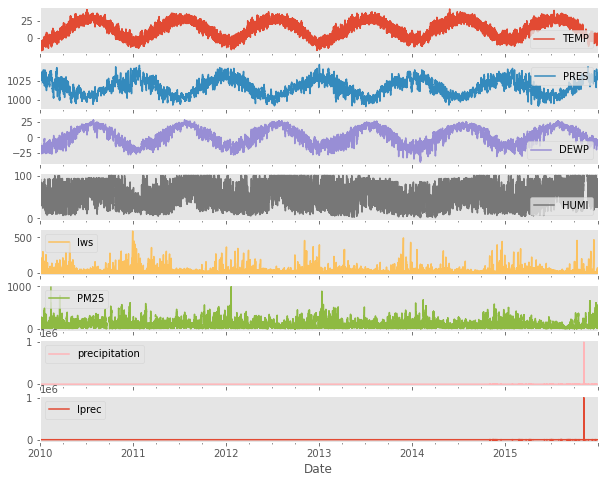

In [20]:
multi_data=df1[['TEMP','PRES','DEWP','HUMI','Iws','PM25','precipitation','Iprec']]
multi_data.plot(subplots=True)

In [21]:
fig = px.line(df1_non_index, x='Date', y='PM25', hover_data=['TEMP','PRES','DEWP',"Iws"], title='PM25')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

## Data cleaning and resampling
- The histogram plot for PM25 values gives an idea that the values are mostly from 1 to 500 and a few high values. 
- From the features visualization analysis the more prominent features are selected for the time series model
 - DEWP: Dew Point (Celsius Degree)
 - TEMP: Temperature (Celsius Degree)
 - PRES: Pressure (hPa)
 - Iws: Cumulated wind speed (m/s)
- The autocorrelation plot shows that the PM2.5 values varies through 2010 to 2015 with time but is stationary and is autocorrelated


## @Comments
- The histogram plot for PM2.5 to get the values distribution
- Just a random check for gaussian distribution of Temperature (thought of building a model with only one feature i.e temperature)
- Dropped the features which were thought to be not correlated to PM2.5 
- The pair-plot, correlation plot and heat map gives confidence in the feature selections
- Dropped the NaN values to plot the autocorrelation plot
- The PM2.5 values are checked for autocorrelation by taking the monthly mean as the hourly data was not significantly visible

array([[<AxesSubplot:title={'center':'PM25'}>,
        <AxesSubplot:title={'center':'TEMP'}>]], dtype=object)

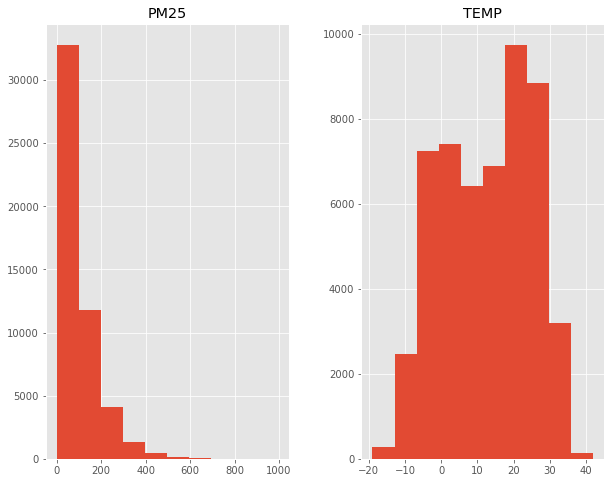

In [22]:
df1[["PM25","TEMP"]].hist()

In [23]:
df1=df1.drop(['No','year','month','day','hour','season','PM_Dongsi','PM_Dongsihuan','PM_Nongzhanguan','PM_US Post','HUMI','cbwd','precipitation','Iprec'],axis=1)

In [24]:
df1.head()

,DEWP,PRES,TEMP,Iws,PM25
Date,,,,,
2010-01-01 00:00:00,-21.0,1021.0,-11.0,1.79,NaN
2010-01-01 01:00:00,-21.0,1020.0,-12.0,4.92,NaN
2010-01-01 02:00:00,-21.0,1019.0,-11.0,6.71,NaN
2010-01-01 03:00:00,-21.0,1019.0,-14.0,9.84,NaN
2010-01-01 04:00:00,-20.0,1018.0,-12.0,12.97,NaN


In [25]:
print ("Rows  :",df1.shape[0])
print("Columns  :", df1.shape[1])
print("\nFeatures  :", df1.isnull().any())
print("\nUnique values  :",df1.nunique())

Rows  : 52584
Columns  : 5

Features  : DEWP    True
PRES    True
TEMP    True
Iws     True
PM25    True
dtype: bool

Unique values  : DEWP      69
PRES      60
TEMP      64
Iws     2975
PM25    2473
dtype: int64


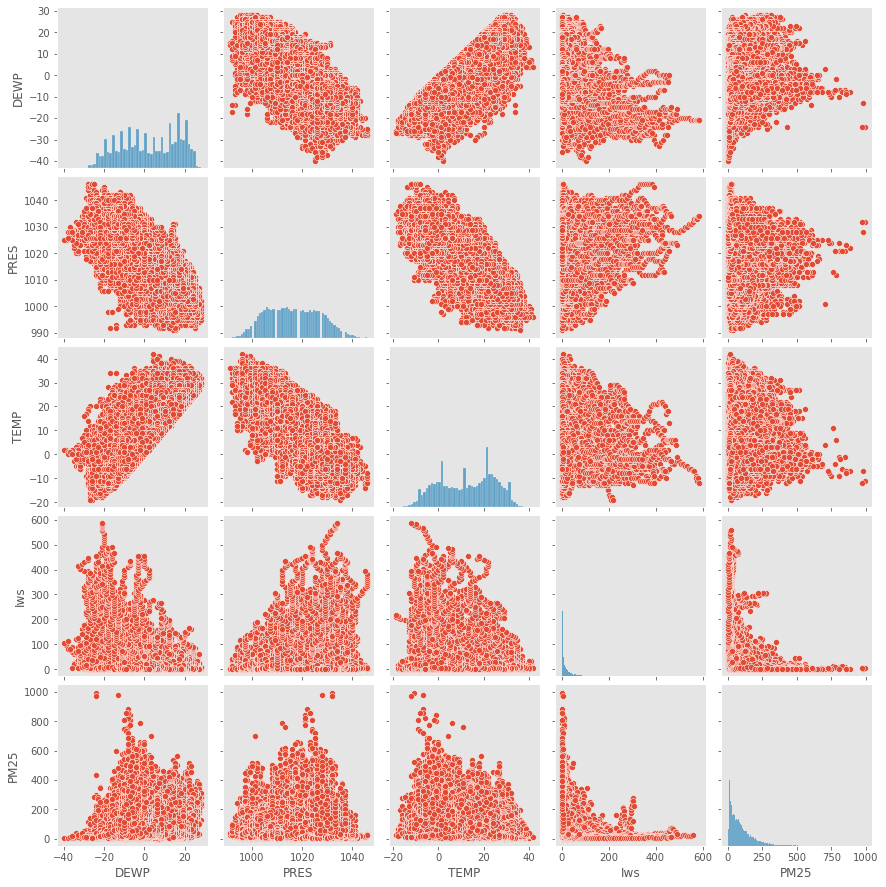

In [26]:
g = sns.pairplot(df1[['DEWP','PRES','TEMP','Iws','PM25']])

In [27]:
df1_corr=df1[['DEWP','PRES','TEMP','Iws','PM25']].corr(method='pearson')
df1_corr

,DEWP,PRES,TEMP,Iws,PM25
DEWP,1.000000,-0.772871,0.819973,-0.289587,0.146459
PRES,-0.772871,1.000000,-0.824840,0.172981,-0.029771
TEMP,0.819973,-0.824840,1.000000,-0.142902,-0.111374
Iws,-0.289587,0.172981,-0.142902,1.000000,-0.243201
PM25,0.146459,-0.029771,-0.111374,-0.243201,1.000000


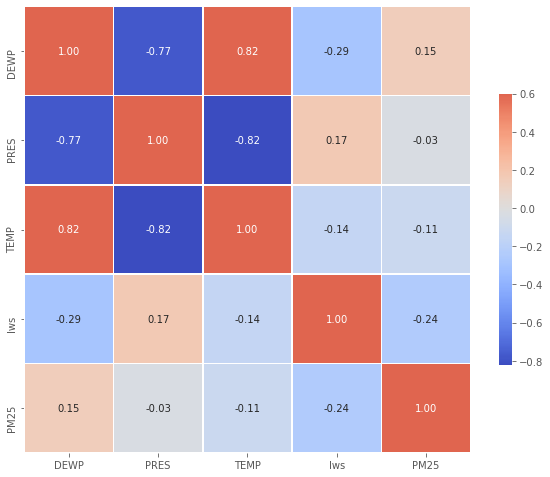

In [28]:
g = sns.heatmap(df1_corr,  vmax=.6, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.figure.set_size_inches(10,10)
    
plt.show()

In [29]:
df1_na=df1.copy()
df1_na=df1_na.dropna()

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

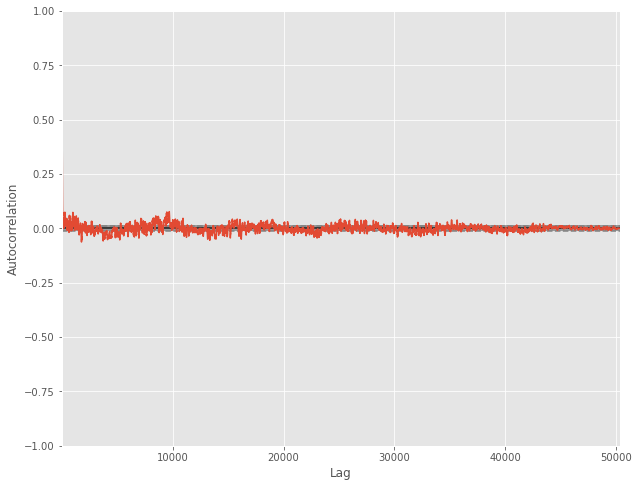

In [30]:
pd.plotting.autocorrelation_plot(df1_na['2010':'2015']['PM25'])

In [31]:
df1_na['PM25'].resample("1m").mean()

Date
2010-01-31     90.403670
2010-02-28     97.239940
2010-03-31     94.046544
2010-04-30     80.072423
2010-05-31     87.071913
                 ...    
2015-08-31     45.929565
2015-09-30     50.924769
2015-10-31     77.257841
2015-11-30    133.407792
2015-12-31    162.391431
Freq: M, Name: PM25, Length: 72, dtype: float64

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

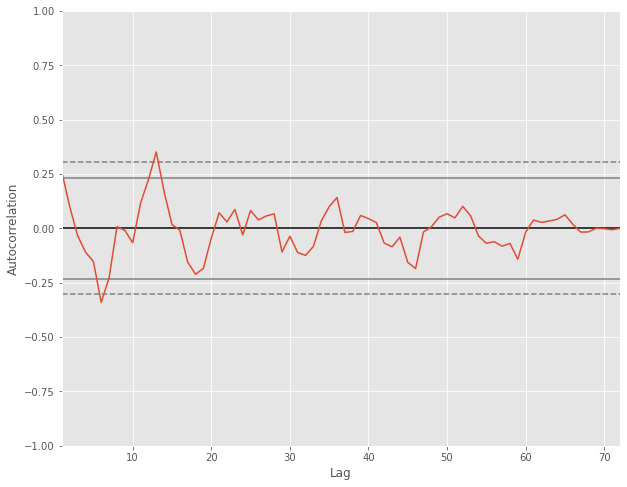

In [32]:
pd.plotting.autocorrelation_plot(df1_na['2010':'2015']['PM25'].resample("1m").mean())

## Model Selection
- The Autoregressive integrated moving average (Auto-ARIMA) model
 - The only seasonality feature was included and the model did not take into account the features like Temperature, wind direction etc. 
 - The model performance was not good as the predicted data was way off the given validation data 
 - It will be good to explore a technique to include features to predict PM2.5 values 
 


- The Facebook’s Prophet model
 - Tried this model as it takes care of the NaN values in the target prediction
 - The model got some error and was not successfull
 - Need to explore a detailed methodology if this model is to be selected



## Multi variate time series model using Deep learning LSTM(Long short-term memory) sequence model

- This model worked well by including 4 dependent/correlated features, namely Dew Point, Temperature, Pressure and Cumulated wind speed for predicting PM2.5 in Beijing city
- The Deep Learning model architecture consist of Sequential layer of LSTM, Dropout and Dense layer with LeakyReLU and Adam Optimizer
- The result gives a good correlation between the actual PM2.5 values and the predicted value

## Dependent feature selection
- The "BeijingPM20100101_20151231.csv" file is selected for this model
- The methods are repeated here as before for
    - Feature selections
    - Taking mean of 4 PM values of 4 regions


In [132]:
df_dl=pd.read_csv("BeijingPM20100101_20151231.csv")

In [133]:
df_dl['Date']=pd.to_datetime(df_dl[["year", "month", "day","hour"]])

In [134]:
df_dl['PM25'] = df_dl[['PM_Dongsi','PM_Dongsihuan','PM_Nongzhanguan','PM_US Post']].mean(skipna=True,axis=1)

In [135]:
df_dl=df_dl.drop(['No','year','month','day','hour','season','PM_Dongsi','PM_Dongsihuan','PM_Nongzhanguan','PM_US Post','HUMI','cbwd','precipitation','Iprec'],axis=1)

## Data scaling and Data selection for train/test
- The NaN values in all the features and the PM2.5 values were filled with forward fill method 
- Since the initial values for PM2.5 was NaN, the first 24 values/rows was dropped
- The complete dataframe was scaled by MinMaxScaler method
- The TimeseriesGenerator method is employed to feed the data in the Deep Neural network architecture
- The complete dataset is split into train and test with 80 to 20 % ratio without shuffle=False, as the time consistency is important in the time series analysis


In [136]:
df_dl.head()

,DEWP,PRES,TEMP,Iws,Date,PM25
0,-21.0,1021.0,-11.0,1.79,2010-01-01 00:00:00,NaN
1,-21.0,1020.0,-12.0,4.92,2010-01-01 01:00:00,NaN
2,-21.0,1019.0,-11.0,6.71,2010-01-01 02:00:00,NaN
3,-21.0,1019.0,-14.0,9.84,2010-01-01 03:00:00,NaN
4,-20.0,1018.0,-12.0,12.97,2010-01-01 04:00:00,NaN


In [137]:
df_dl.drop(df_dl.index[0:23],0,inplace=True)

In [138]:
df_dl.head()

,DEWP,PRES,TEMP,Iws,Date,PM25
23,-17.0,1020.0,-5.0,0.89,2010-01-01 23:00:00,129.0
24,-16.0,1020.0,-4.0,1.79,2010-01-02 00:00:00,148.0
25,-15.0,1020.0,-4.0,2.68,2010-01-02 01:00:00,159.0
26,-11.0,1021.0,-5.0,3.57,2010-01-02 02:00:00,181.0
27,-7.0,1022.0,-5.0,5.36,2010-01-02 03:00:00,138.0


In [139]:
df_dl.isnull().sum()

DEWP       5
PRES     339
TEMP       5
Iws        5
Date       0
PM25    1871
dtype: int64

In [140]:
df_dl['PM25']=df_dl['PM25'].fillna(method='ffill')
df_dl['DEWP']=df_dl['DEWP'].fillna(method='ffill')
df_dl['PRES']=df_dl['PRES'].fillna(method='ffill')
df_dl['TEMP']=df_dl['TEMP'].fillna(method='ffill')
df_dl['Iws']=df_dl['Iws'].fillna(method='ffill')

In [141]:
df_dl.isnull().sum()

DEWP    0
PRES    0
TEMP    0
Iws     0
Date    0
PM25    0
dtype: int64

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

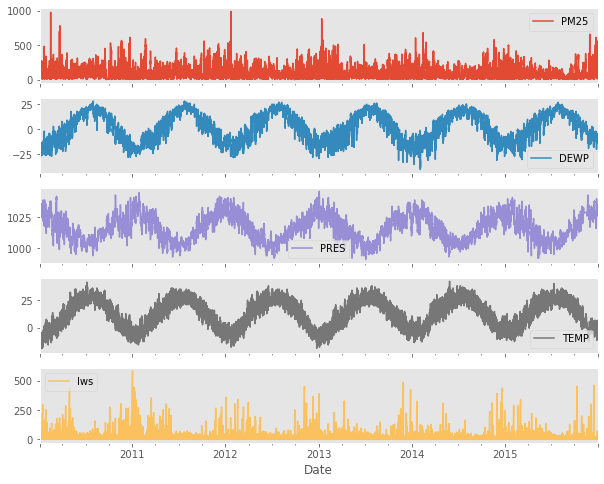

In [142]:
df_dl.set_index('Date')[['PM25','DEWP','PRES','TEMP','Iws']].plot(subplots=True)

In [143]:
df_dl_input=df_dl[['PM25','DEWP','PRES','TEMP','Iws']]

In [144]:
df_dl_input.describe()

,PM25,DEWP,PRES,TEMP,Iws
count,52561.000000,52561.000000,52561.000000,52561.000000,52561.000000
mean,94.614748,2.084036,1016.543654,12.595613,23.267581
std,89.847397,14.218198,10.311334,12.093915,49.294777
min,1.000000,-40.000000,991.000000,-19.000000,0.450000
25%,27.000000,-10.000000,1008.000000,2.000000,1.790000
50%,69.000000,2.000000,1016.000000,14.000000,4.920000
75%,131.666667,15.000000,1025.000000,23.000000,21.020000
max,994.000000,28.000000,1046.000000,42.000000,585.600000


In [145]:
df_dl_input.query("PM25>500")

,PM25,DEWP,PRES,TEMP,Iws
1056,980.00,-13.0,1028.0,-7.0,0.89
1057,980.00,-14.0,1029.0,-7.0,0.89
1058,599.00,-14.0,1029.0,-5.0,3.13
1875,700.00,3.0,1001.0,4.0,1.79
1876,700.00,2.0,1000.0,6.0,4.92
...,...,...,...,...,...
52431,608.00,-4.0,1016.0,-2.0,5.37
52432,567.50,-4.0,1016.0,-3.0,7.16
52531,527.25,-6.0,1027.0,-3.0,1.78
52532,562.50,-6.0,1028.0,-3.0,0.89


In [146]:
scaler=MinMaxScaler()
data_scaled=scaler.fit_transform(df_dl_input)

In [147]:
data_scaled #between 0 and 1

array([[0.12890232, 0.33823529, 0.52727273, 0.2295082 , 0.00075194],
       [0.14803625, 0.35294118, 0.52727273, 0.24590164, 0.00229001],
       [0.1591138 , 0.36764706, 0.52727273, 0.24590164, 0.00381099],
       ...,
       [0.20065458, 0.44117647, 0.70909091, 0.21311475, 0.00075194],
       [0.22029204, 0.44117647, 0.70909091, 0.21311475, 0.00227292],
       [0.23564955, 0.45588235, 0.69090909, 0.21311475, 0.0037939 ]])

In [148]:
features=data_scaled
target=data_scaled[:,0]

In [149]:
TimeseriesGenerator(features,target,length=2,sampling_rate=1,batch_size=1)[0]

(array([[[0.12890232, 0.33823529, 0.52727273, 0.2295082 , 0.00075194],
         [0.14803625, 0.35294118, 0.52727273, 0.24590164, 0.00229001]]]),
 array([0.1591138]))

In [150]:
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.20, random_state=123, shuffle = False)

In [151]:
x_train.shape

(42048, 5)

In [152]:
x_test.shape

(10513, 5)

In [153]:
win_length=120
batch_size=32
num_features=5
train_generator = TimeseriesGenerator(x_train, y_train, length=win_length, sampling_rate=1, batch_size=batch_size)
test_generator = TimeseriesGenerator(x_test, y_test, length=win_length, sampling_rate=1, batch_size=batch_size)

## Model Architecture
- The model consists of Sequential layer with 2 LSTM layer followed by LeakyReLU and then followed by 2 Dropout Layer with a LSTM layer in between and finally the dense layer with 1 value of PM2.5
- The model consists of 5 features including the PM2.5 with a window length =120. This window is for 5 days and as each day has 24 data points
- The batch size is 32. The hyperparameters were tuned several times to get a good fit

In [154]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(128, input_shape= (win_length, num_features), return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5)) 
model.add(tf.keras.layers.LSTM(128, return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5)) 
model.add(tf.keras.layers.Dropout(0.3)) 
model.add(tf.keras.layers.LSTM(64, return_sequences=False))
model.add(tf.keras.layers.Dropout(0.3)) 
model.add(tf.keras.layers.Dense(1))

In [155]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 120, 128)          68608     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 120, 128)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 120, 128)          131584    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 120, 128)          0         
_________________________________________________________________
dropout (Dropout)            (None, 120, 128)          0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0

## Model Training 
- The model was trained for 50 epochs. Other values of 100 epochs were tried, but with not much improvement in the model performence
- The method of early stopping was applied and the model worked well and stopped in the 4th epoch
- The training mean_absolute_error is 0.0164
- The model was evaluated with test data 
- The predicted value was evaluted by test generator
- The inverse of the scalling method is applied to get the real value of PM2.5
- A data frame is concatinated with real PM2.5 and the PM2.5 predicted values


In [156]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=2,
                                                    mode='min')

model.compile(loss=tf.losses.MeanSquaredError(),
              optimizer=tf.optimizers.Adam(),
              metrics=[tf.metrics.MeanAbsoluteError()])

history = model.fit_generator(train_generator, epochs=50,
                    validation_data=test_generator,
                    shuffle=False,
                    callbacks=[early_stopping])

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/50
1311/1311 [==============================] - 312s 238ms/step - loss: 0.0031 - mean_absolute_error: 0.0367 - val_loss: 9.5257e-04 - val_mean_absolute_error: 0.0225
Epoch 2/50
1311/1311 [==============================] - 311s 237ms/step - loss: 9.2345e-04 - mean_absolute_error: 0.0193 - val_loss: 4.3001e-04 - val_mean_absolute_error: 0.0142
Epoch 3/50
1311/1311 [==============================] - 329s 251ms/step - loss: 7.0787e-04 - mean_absolute_error: 0.0170 - val_loss: 4.8361e-04 - val_mean_absolute_error: 0.0167
Epoch 4/50
1311/1311 [==============================] - 332s 253ms/step - loss: 6.7318e-04 - mean_absolute_error: 0.0164 - val_loss: 6.1225e-04 - val_mean_absolute_error: 0.0204


In [157]:
model.evaluate_generator(test_generator, verbose=0)

Instructions for updating:
Please use Model.evaluate, which supports generators.


[0.0006122527993284166, 0.020432500168681145]

In [158]:
predictions=model.predict_generator(test_generator)

Instructions for updating:
Please use Model.predict, which supports generators.


In [159]:
y_test

array([0.15072172, 0.15642833, 0.16146358, ..., 0.20065458, 0.22029204,
       0.23564955])

In [160]:
x_test

array([[1.50721719e-01, 7.79411765e-01, 4.54545455e-01, 5.73770492e-01,
        1.22190891e-02],
       [1.56428332e-01, 7.79411765e-01, 4.54545455e-01, 5.73770492e-01,
        1.52781338e-02],
       [1.61463578e-01, 7.79411765e-01, 4.54545455e-01, 5.57377049e-01,
        1.67991113e-02],
       ...,
       [2.00654582e-01, 4.41176471e-01, 7.09090909e-01, 2.13114754e-01,
        7.51943946e-04],
       [2.20292044e-01, 4.41176471e-01, 7.09090909e-01, 2.13114754e-01,
        2.27292147e-03],
       [2.35649547e-01, 4.55882353e-01, 6.90909091e-01, 2.13114754e-01,
        3.79389900e-03]])

In [161]:
x_test[:,1:][win_length:]

array([[0.73529412, 0.36363636, 0.49180328, 0.        ],
       [0.73529412, 0.38181818, 0.49180328, 0.00076903],
       [0.73529412, 0.38181818, 0.47540984, 0.00229001],
       ...,
       [0.44117647, 0.70909091, 0.21311475, 0.00075194],
       [0.44117647, 0.70909091, 0.21311475, 0.00227292],
       [0.45588235, 0.69090909, 0.21311475, 0.0037939 ]])

In [162]:
df_pred=pd.concat([pd.DataFrame(predictions), pd.DataFrame(x_test[:,1:][win_length:])],axis=1)

In [163]:
df_pred

,0,0,1,2,3
0,0.318106,0.735294,0.363636,0.491803,0.000000
1,0.367062,0.735294,0.381818,0.491803,0.000769
2,0.309811,0.735294,0.381818,0.475410,0.002290
3,0.311391,0.720588,0.381818,0.475410,0.005349
4,0.292215,0.735294,0.363636,0.475410,0.000752
...,...,...,...,...,...
10388,0.106457,0.470588,0.727273,0.262295,0.011433
10389,0.128284,0.470588,0.709091,0.278689,0.012954
10390,0.157744,0.441176,0.709091,0.213115,0.000752
10391,0.190856,0.441176,0.709091,0.213115,0.002273


In [164]:
rev_trans=scaler.inverse_transform(df_pred)

In [165]:
rev_trans

array([[ 3.16879372e+02,  1.00000000e+01,  1.01100000e+03,
         1.10000000e+01,  4.50000000e-01],
       [ 3.65492598e+02,  1.00000000e+01,  1.01200000e+03,
         1.10000000e+01,  9.00000000e-01],
       [ 3.08642437e+02,  1.00000000e+01,  1.01200000e+03,
         1.00000000e+01,  1.79000000e+00],
       ...,
       [ 1.57640152e+02, -1.00000000e+01,  1.03000000e+03,
        -6.00000000e+00,  8.90000000e-01],
       [ 1.90520047e+02, -1.00000000e+01,  1.03000000e+03,
        -6.00000000e+00,  1.78000000e+00],
       [ 2.06402072e+02, -9.00000000e+00,  1.02900000e+03,
        -6.00000000e+00,  2.67000000e+00]])

In [166]:
df_final=df_dl_input[predictions.shape[0]*-1:]

In [167]:
df_final.count()

PM25    10393
DEWP    10393
PRES    10393
TEMP    10393
Iws     10393
dtype: int64

In [168]:
df_final['PM25_Pred']=rev_trans[:,0]

<ipython-input-168-fd4dfc84d15b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Model metrics with plots and interpretation
- The actual PM2.5 and the predicted PM2.5 value is in well agreement
- The plot shows the good overlap of the PM2.5 actual value and the predicted value
- The model metrics for the performance is further checked with the linear correlation of the actual and the predicted PM2.5 values
- The next plot below shows that the calculated and predicted values are in good agreement for PM2.5 values less than 500 and is scattered for values greater than 500

In [170]:
df_final.head()

,PM25,DEWP,PRES,TEMP,Iws,PM25_Pred
42191,353.25,10.0,1011.0,11.0,0.45,316.879372
42192,326.00,10.0,1012.0,11.0,0.90,365.492598
42193,309.00,10.0,1012.0,10.0,1.79,308.642437
42194,295.00,9.0,1012.0,10.0,3.58,310.211437
42195,286.75,10.0,1011.0,10.0,0.89,291.169781


<AxesSubplot:>

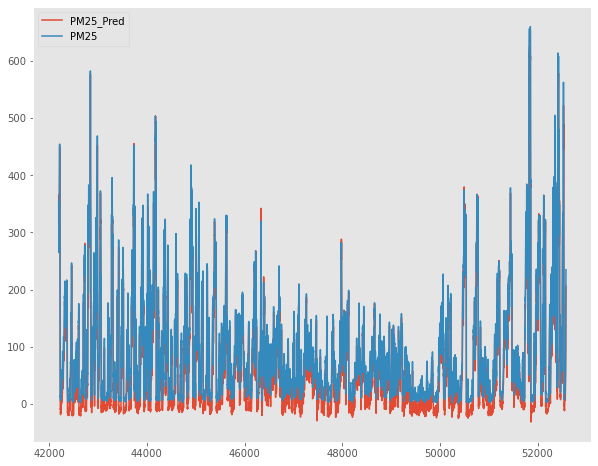

In [169]:
df_final[['PM25_Pred','PM25']].plot()

<AxesSubplot:xlabel='PM25'>

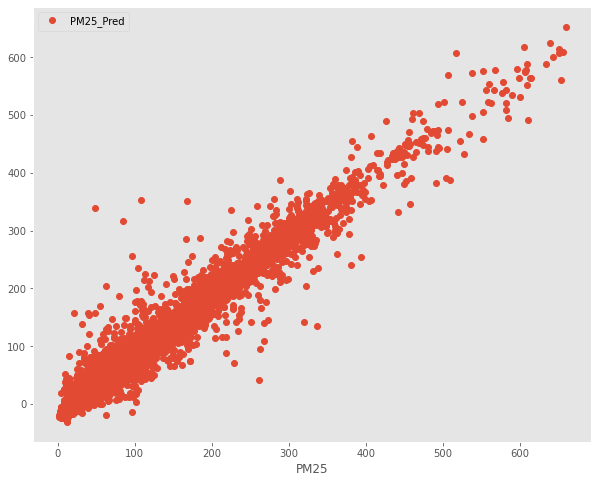

In [177]:
df_final.plot(x='PM25', y='PM25_Pred', style='o')

## Conclusions
- There are various time series data analysis models available e.g Auto-ARIMA, Facebook's PROPHET etc. The  The model performance is very crucial on the feature selection
- With my few experiences in time series data analysis, I felt, I got more flexibility to tune the hyperparamter in the Deep learning LSTM(Long short-term memory) sequence model
- The data is analysed only for the Beijing city. The model performance can be checked for other 4 cities for a better decision
- The 'Combined wind direction' feature being in the string format was neglected. The PM2.5 value is dependent in the wind direction. It would have been good if this feature was also included by changing it to a parameter fit to feed the model
- The data is not limited, with 52584 data points a model with good performance can be build. 
- Had to drop the first few (24 data points) because of forward fill method. Other method can be applied like backward fill, etc. to include those data points
- The model does not look overfitted but it misses to get the higher values of PM2.5. This higher values should be checked if they are outliers or really Beijing city gets this high value
- The LSTM sequential model can be applied to forecast the PM2.5 values in China with further insights as stated above.